# chapter 8 신경망, 딥러닝의 응용(필기체 숫자 인식)


---------
실질적인 문제로 들어가 필기체 숫자를 피드 포워드 네트워크에 인식시켜 보자.

### 8.1 MNIST 데이터베이스

 - 필기체 숫자 데이터셋에는 MNIST라는 유명한 데이터베이스를 사용
 - MNIST는 THE MNIST DATABASE of handwritten 웹사이트에서 무료로 다운로드할 수 있지만, 케라스 코드를 사용하면 더 쉽게 사용할 수 있다.
 

In [ ]:
#-- 리스트 8-1-(1)
from keras.datasets import mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

- 실행하면 60,000개의 훈련용 데이터(이미지와 라벨)가 x_train, y_train에 저장되며, 10,000개의 테스트용 데이터느s x_test, y_test에 저장된다.
- x_train은 60000x28x28의 배열 변수로, 각 요소는 0-255의 값을 갖는 정수이다. 
- i번째 이미지는 x_train[i:,:] 명령으로 꺼내 수 있다.
- y_train의 각 요소는 0-9의 정수 값을 취하며, 길이가 60000인 1차원 배열 변수로, y[i]에는 이미지 i에 대응하는 0-9의 값이 포함되어 있다.

- x_train에 저장된 처음 3개의 이미지를 다음과 같이 표시한다.
- 목표데이터 y_train의 값은 이미지의 우측 하단에 파란색 숫자로 표시하였다. 

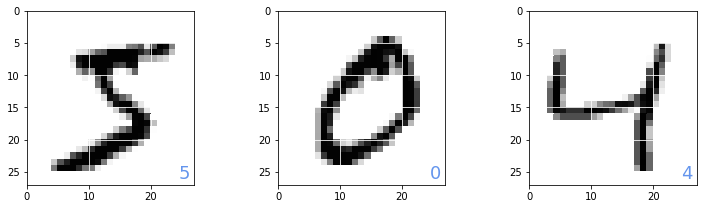

In [2]:
# - 리스트 8-1-(2)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(1, figsize=(12, 3.2))
plt.subplots_adjust(wspace=0.5)
plt.gray()
for id in range(3):
    plt.subplot(1, 3, id + 1)
    img = x_train[id, :, :]
    plt.pcolor(255 - img)
    plt.text(24.5, 26, "%d" % y_train[id],
             color='cornflowerblue', fontsize=18)
    plt.xlim(0, 27)
    plt.ylim(27, 0)
    plt.grid('on', color='white')
plt.show()

### 8.2 2층 피드 포워드 네트워크 모델

7장에서 다룬 2층 피드 포워드 네트워크 모델을 사용해 이 필기체 숫자의 클래스 분류 문제가 해결되는지 살펴보자.
우선 데이터를 사용하기 쉬운 형태로 변경한다. 

In [ ]:
#-- 리스트 8-1-(3)
from keras.utils import np_utils


x_train = x_train.reshape(60000, 784) # (A)
x_train = x_train.astype('float32') # (B)
x_train = x_train / 255 # (C)
num_classes = 10
y_train = np_utils.to_categorical(y_train, num_classes) # (D)


x_test = x_test.reshape(10000, 784)
x_test = x_test.astype('float32')
x_test = x_test / 255
y_test = np_utils.to_categorical(y_test, num_classes)

- 이 네트워크는 28x28의 이미지 데이터를 784 길이의 벡터로 처리한다.
- (A): 60000x28x28의 배열을 60000x784의 배열로 변환한다.
- (B): 입력은 실수로 처리하고 싶으므로 int를 float으로 변환한다.
- (C): 255로 나누어 0~1 사이의 실수로 반환하도록 한다.
- (D): y_train의 요소는 0-9의 정수이며, np_utils.to_categorical()이라는 케라스 함수를 사용하여 1-of-K 부호화법으로 변경한다.
- 마찬가지로 x_test와 y_test도 동일하게 변경한다. 

#### 필기체 숫자 인식을 위한 2층 피드 포워드 네트워크
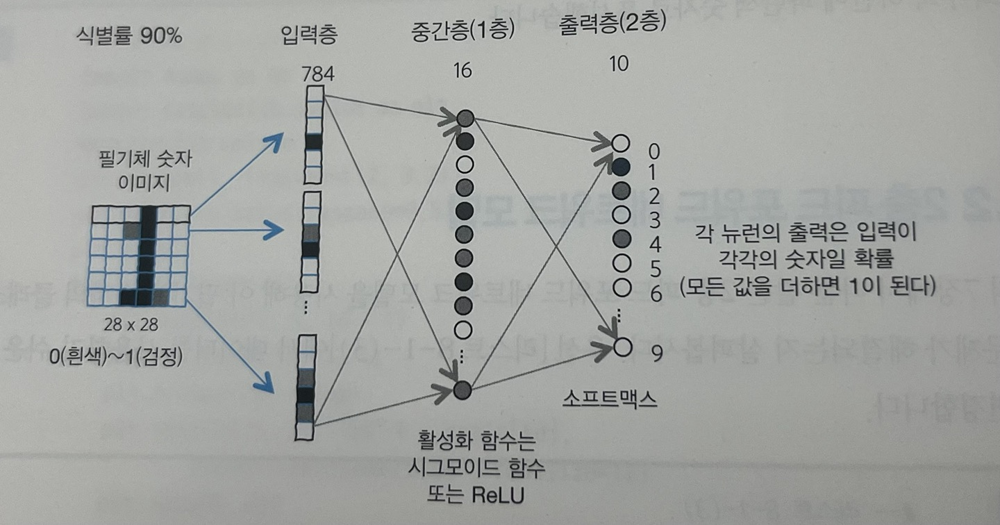


- 입력은 784차원의 벡터
- 네트워크의 출력층은 10개의 숫자를 분류할 수 있도록 10개의 뉴런으로 하여, 각 뉴런의 출력값이 확률을 나타내도록 하기 위해 활성화 함수는 소프트맥스를 사용함
- 입력과 출력을 연결하는 중간층은 16개로 하고, 활성화 함수는 시그모이드 함수로 한다. 

In [4]:
#-- 리스트 8-1-(4)
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.optimizers import Adam


model = Sequential() # (A)
model.add(Dense(16, input_dim=784, activation='sigmoid')) # (B)
model.add(Dense(10, activation='softmax')) # (C)
model.compile(loss='categorical_crossentropy',
optimizer=Adam(), metrics=['accuracy']) # (D)

- (A): model을 Sequential()로 정의
- (B):784차원의 입력을 갖는 16개의 중간층 정의
- (C): 10개의 출력층을 정의
- (D): model.complie()의 인수에 optimizer.Adam() 을 통해 알고리즘을 Adam으로 설정
- Adam은 2015년에 Diederik P.Kingma등이 발표한 알고리즘에서 경사 하강법을 더 세련되게 한 것임.

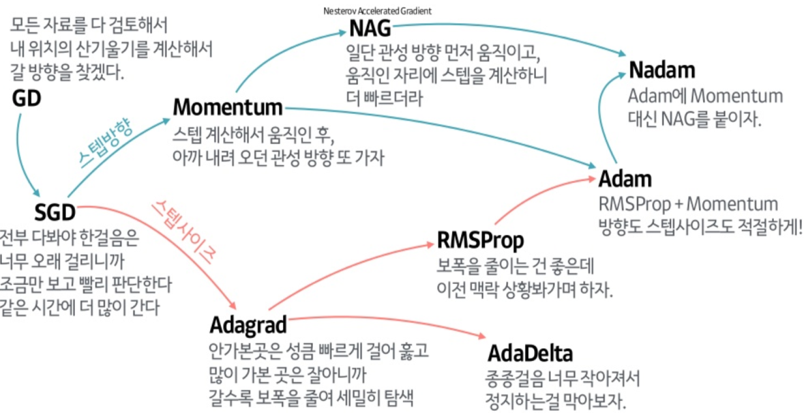

#### Adaptive Moment Estimation (Adam)
RMSProp와 Momentum 기법을 합친 optimizer. Momentum에서 관성계수 mm과 함께 계산된 $V_t$로 파라미터를 업데이트 하지만 Adam에서는 기울기 값과 기울기의 제곱값의 지수이동평균을 활용하여 step변화량을 조절한다.

출처: https://onevision.tistory.com/entry/Optimizer-의-종류와-특성-Momentum-RMSProp-Adam [312 개인 메모장]

In [5]:
#-- 리스트 8-1-(5)
import time


startTime = time.time()
history = model.fit(x_train, y_train, epochs=10, batch_size=1000,
                    verbose=1, validation_data=(x_test, y_test)) # (A)
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))

Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 1s 25us/step - loss: 2.0663 - acc: 0.2861 - val_loss: 1.7901 - val_acc: 0.4952
Epoch 2/10
60000/60000 [==============================] - 1s 22us/step - loss: 1.6092 - acc: 0.6483 - val_loss: 1.4405 - val_acc: 0.7655
Epoch 3/10
60000/60000 [==============================] - 1s 23us/step - loss: 1.3224 - acc: 0.7872 - val_loss: 1.2012 - val_acc: 0.8196
Epoch 4/10
60000/60000 [==============================] - 1s 23us/step - loss: 1.1159 - acc: 0.8241 - val_loss: 1.0217 - val_acc: 0.8443
Epoch 5/10
60000/60000 [==============================] - 1s 21us/step - loss: 0.9570 - acc: 0.8433 - val_loss: 0.8818 - val_acc: 0.8580
Epoch 6/10
60000/60000 [==============================] - 1s 23us/step - loss: 0.8330 - acc: 0.8583 - val_loss: 0.7737 - val_acc: 0.8707
Epoch 7/10
60000/60000 [==============================] - 1s 21us/step - loss: 0.7375 - acc: 0.8690 - val_loss: 0.6899 - val_acc

#### 결과해석
- (A)에서 verbose= 1로 설정하여 매 시기의 학습 평가치가 표시되며, 최종적으로 테스트 데이터의 상호 엔트로피 오차, 정답률, 게산 시간이 표시된다.
- 지금까지는 전체 데이터셋에 대한 오차 함수의 기울기를 갱신 1단계마다 계산하고 있었다. 하지만 데이터가 크면 계산에 많은 시간이 걸린다. 그런 경우에는 데이터의 일부로 오차 함수의 기울기를 계산하는 **'확률적 경사 하강법'** 이 사용된다.

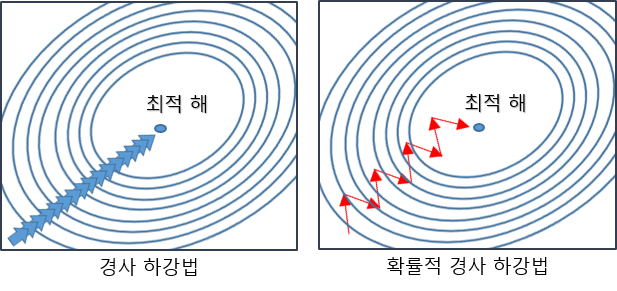

##### 확률적 경사 하강법(Stochastic Gradient Descent)
- 추출된 데이터 한개에 대해서 그래디언트를 계산하고, 경사 하강 알고리즘을 적용하는 방법을 말한다. 
- 경사하강법은 전체 데이터를 모두 사용해서 기울기를 계산(Batch Gradient Descent)하기 때문에 학습하는데 많은 시간이 필요함. -> 학습데이터가 큰 경우 부담 있음.

- 만약, 10만개의 데이터가 있을 때, 데이터에 업데이트가 있을 때마다 10만번의 계산을 해야함.
- 이러한 점을 보완하기 위해 확률적 경사하강법 사용.

- 매 step에서 딱 한개의 샘플을 무작위로 선택하고 그 하나의 샘플에 대한 기울기 계산.

- 배치 크기가 1인 경사하강법 알고리즘.


#### 특징
- 매우 적은 데이터를 처리하기에 학습 속도가 빠름.

- 하나의 샘플만 메모리에 있으면 되기 때문에 큰 데이터셋도 학습 가능.

- Cost Function이 매우 불규칙할 경우, 알고리즘이 local minimum을 건너뛰도록 도와주어 global minimum을 찾을 가능성이 높음.

- 샘플의 선택이 확률적(Stochastic)이기 때문에 배치 경사 하강법에 비해 불안정.

- cost funciton이 local minimum에 이를 때까지 부드럽게 감소하지 않고 위아래로 요동치며 평균적으로 감소.

- 반복이 충분하면 SGD가 효과 있지만 노이즈가 매우 심함.

- SGD의 여러 변형 함수의 최저점에 가까운 점을 찾을 가능성이 높지만 항상 보장되지는 않음.


--------
- 1회 갱신에 사용하는 데이터의 크기는 배치 크기(batch_size)로 정의하며 (A)의 batch_size= 1000 에서 지정하고 있다. 이렇게 지정하면 갱신할 때마다 다른 1000개의 데이터셋에서 기울기가 계산된 매개 변수가 갱신되어 간다. 
- 일부 데이터셋에서 계산된 기울기 방향은 전체 데이터셋에서 계산된 실제 기울기 방향과는 약간 다르다.
- 즉, 전체 오차를 최소화하는 방향으로 곧장 나아가는 것이 아니라, 노이즈의 영향을 받는 것처럼 휘청거리면서 서서히 오차가 낮은 방향으로 나아간다. 

#### Local Minima

Local minima 문제는 에러를 최소화시키는 최적의 파라미터를 찾는 문제에 있어서 아래 그림처럼 파라미터 공간에 수많은 지역적인 홀(hole)들이 존재하여 이러한 local minima에 빠질 경우 전역적인 해(global minimum)를 찾기 힘들게 되는 문제를 일컫는다.

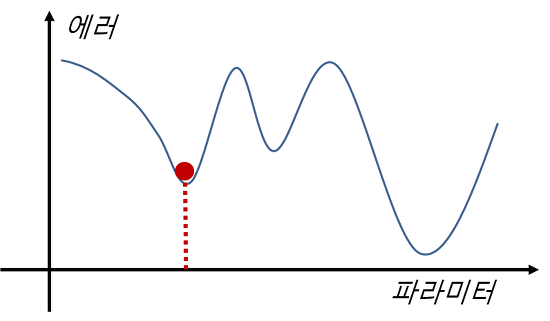

그리고 기존에 기계학습(machine learning)이 잘 안되거나 성능이 잘 안나오는 이유는 학습 도중 이러한 local minima에 빠졌기 때문이라는 게 일반적인 상식이었다.



하지만 이 논문은 기존의 상식을 깨고 local minima 문제가 사실은 고차원(high dimensional)의 공간에서는 발생하기 힘든 매우 희귀한 경우라고 주장한다.



그 이유는 예를 들어, local minimum이 형성되기 위해서는 함수의 변화 그래프가 모든 축의 방향으로 밥그릇처럼 오목한 형태가 되어야 하지만 아래 그림의 p처럼 어느 한 방향이라도 아래로 흘러내리면 local minima가 형성되지 않기 때문이다. 그리고 고차원의 공간에서 모든 축의 방향으로 오목한 형태가 형성될 확률은 거의 0에 가깝다는게 주장의 요지이다.

또한 local minima 문제는 에러를 최소화시키는 최적의 인수를 찾는 문제에 있어서, 인수 공간에 수많은 지역적인 홀(hole)이 존재하여, 이러한 local minima에 빠질 경우 전역적인 헤 (Global minima)를 찾기 힘들게 되는 문제를 일컫는다. 

-------------

기존의 경사하강법은 일단 local minimum problem 에 빠지면 그곳이 아무리 얕아도 빠져나갈 수 없다. 하지만 확률적 경사 하강법의 경우 휘청거리는 효과 덕분에 국소해에서 벗어날 수 있는 유용한 성질이 있다. 

(A)에서 epochs는 학습 갱신 횟수를 정하는 매개 변수이다. 예를 들어 훈련 데이터 6만 개에 batch_size를 1000으로 할 경우, 학습 데이터를 모두 사용하는 데 60회의 매개 변수 갱신이 진행된다. 이를 1 epochs라고 한다. nb_epochs =10으로 지정하면 그 10배이므로 600회의 매개 변수 갱신이 이루어진다.

(A)의 verbose = 1 은 학습 과정의 표시를 정한다. 이를 통해 학습의 진행 상태가 표시되고 매 시기의 오차, 정밀도, 계산 시간이 표시된다. 

- overfitting 이 일어나지 않았는지 확인하기 위해 테스트 데이터 오차의 시간 변화를 살펴보자. 

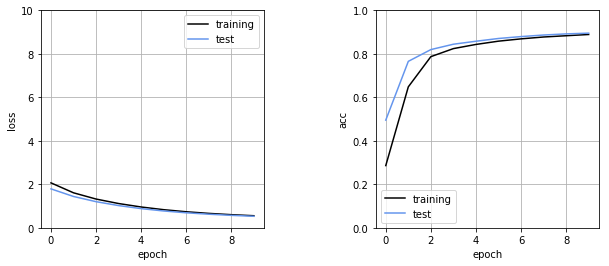

In [6]:
#-- 리스트 8-1-(6)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


plt.figure(1, figsize=(10, 4))
plt.subplots_adjust(wspace=0.5)


plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='training', color='black')
plt.plot(history.history['val_loss'], label='test',
         color='cornflowerblue')
plt.ylim(0, 10)
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')


plt.subplot(1, 2, 2)
plt.plot(history.history['acc'], label='training', color='black')
plt.plot(history.history['val_acc'],label='test', color='cornflowerblue')
plt.ylim(0, 1)
plt.legend()
plt.grid()
plt.xlabel('epoch')
plt.ylabel('acc')
plt.show()

#### 결과해석
- 출력 결과를 보니 오버피팅은 일어나지 않은 것 같다.
- 이제 실제 테스트 데이터를 입력했을 때의 모델의 출력을 확인하자.

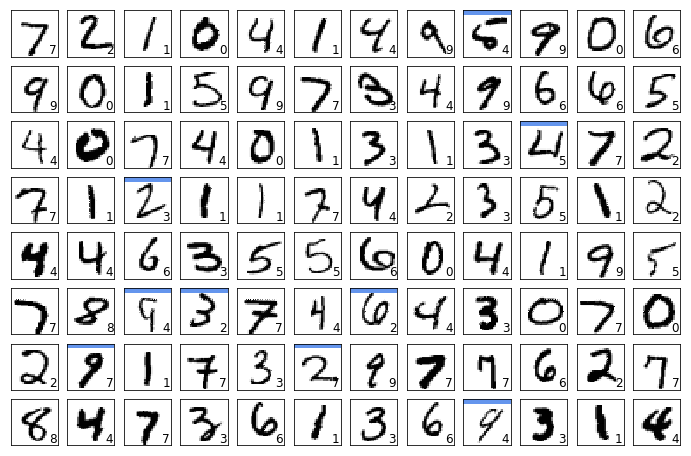

In [7]:
#-- 리스트 8-1-(7)
def show_prediction():
    n_show = 96
    y = model.predict(x_test) # (A)
    plt.figure(2, figsize=(12, 8))
    plt.gray()
    for i in range(n_show):
        plt.subplot(8, 12, i + 1)
        x = x_test[i, :]
        x = x.reshape(28, 28)
        plt.pcolor(1 - x)
        wk = y[i, :]
        prediction = np.argmax(wk)
        plt.text(22, 25.5, "%d" % prediction, fontsize=12)
        if prediction != np.argmax(y_test[i, :]):
            plt.plot([0, 27], [1, 1], color='cornflowerblue', linewidth=5)
        plt.xlim(0, 27)
        plt.ylim(27, 0)
        plt.xticks([], "")
        plt.yticks([], "")
#-- 메인
show_prediction()
plt.show()

- (A)의 y = model.predict(x_test)에서 x_test 전체에 대한 모델의 출력 y를 얻을 수 있다. 그 중에서 처음 96개의 분량을 표시했다.
- 이처럼 모델의 성능을 직접 보는 것이 중요하다. 모델의 움직임을 실감할 수 있다. 대체로 잘 동작하는 것 처럼 보이지만 잘못된 데이터가 여러개 있다. 아무리 봐도 3인데 2로 대답하거나 아무리 봐도 3인데 2로 대답하는 경우도 있다. 이 정도는 그다지 만족스럽지 않은 수준이라고 말할 수 있다. 

 ### 8.3 RELU 활성화 함수
 
-  활성화함수는 전통적으로 시그모이드 함수가 사용되었지만 최근에는 ReLU라는 활성함수가 인기이다.
- 2015년에 얀, 벤지오, 힌튼이 네이처에 발표한 논문에서는 ReLU이 활성화함수 로서 최선이라고 하였다. 


#### ReLU 활성화함수
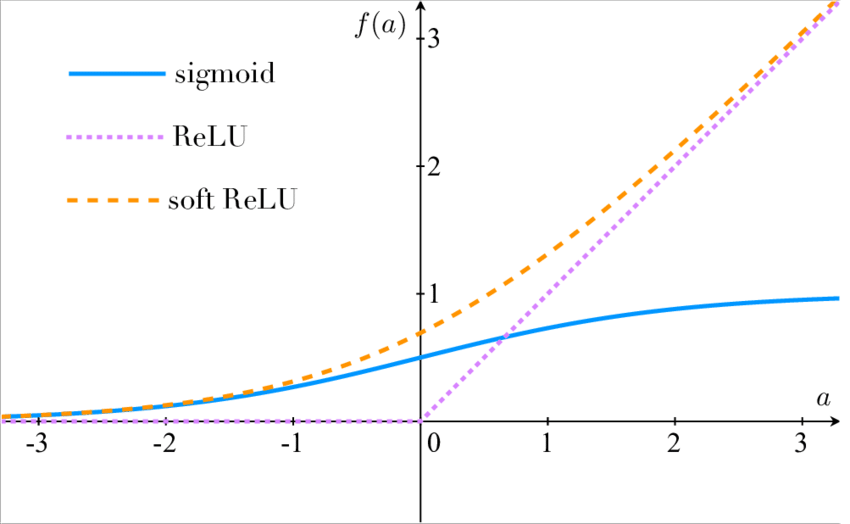

- 시그모이드 함수는 입력 x가 어느 정도 커지면 항상 1에 가까운 값을 출력하기 때문에, 입력의 변화가 출력에 반영되기 어렵다.
- 그 결과, 오차 함수의 가중치 매개 변수에 대한 편미분이 0에 가까운 값이 되어, 경사 하강법의 학습이 늦어지는 문제가 있었다. 
- 그러나 ReLU를 사용하면 입력이 긍정적이면 학습 정체 문제는 해결된다. 
- 또한 프로그램에서는 **max(0,x)** 로 쉽게 나타낼 수 있기 때문에 계산이 빠르다는 장점도 있다.

네트워크 중간층의 활성화 함수를 ReLU 로 바꾸어 실행히보자. 중간층의 activation을 'sigmoid' 에서 'relu;로 바꾸었다. 

In [8]:
#-- 리스트 8-1-(8)
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.optimizers import Adam


model = Sequential()
model.add(Dense(16, input_dim=784, activation='relu')) # (A)
model.add(Dense(10, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(), metrics=['accuracy'])


startTime = time.time()
history = model.fit(x_train, y_train, batch_size=1000, epochs=10,
                    verbose=1, validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))

Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 1s 21us/step - loss: 1.5461 - acc: 0.5425 - val_loss: 0.9006 - val_acc: 0.8073
Epoch 2/10
60000/60000 [==============================] - 1s 18us/step - loss: 0.6691 - acc: 0.8450 - val_loss: 0.4987 - val_acc: 0.8772
Epoch 3/10
60000/60000 [==============================] - 1s 18us/step - loss: 0.4513 - acc: 0.8828 - val_loss: 0.3898 - val_acc: 0.9001
Epoch 4/10
60000/60000 [==============================] - 1s 16us/step - loss: 0.3751 - acc: 0.8988 - val_loss: 0.3395 - val_acc: 0.9106
Epoch 5/10
60000/60000 [==============================] - 1s 15us/step - loss: 0.3351 - acc: 0.9076 - val_loss: 0.3103 - val_acc: 0.9169
Epoch 6/10
60000/60000 [==============================] - 1s 18us/step - loss: 0.3092 - acc: 0.9132 - val_loss: 0.2918 - val_acc: 0.9202
Epoch 7/10
60000/60000 [==============================] - 1s 16us/step - loss: 0.2911 - acc: 0.9178 - val_loss: 0.2761 - val_acc

#### 결과해석
약 92~95%정도의 정확도가 나왔고 sigmoid 함수를 사용한 결과와 비교하면 약 3%의 정확도가 올랐다.

이후 show_prediction()을 실행하면 테스트 데이터 인식의 예를 볼 수 있다.

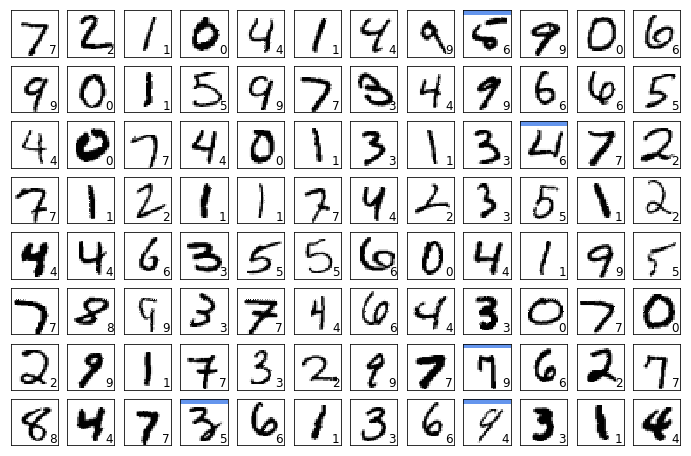

In [9]:
# 리스트 8-1-(9)
show_prediction()
plt.show()

#### 결과해석
- 처음 96개의 데이터 중 잘못 인식한 것이 5개로 줄었다.
- 수치상으로 단 3% 향상한 것이지만 실제 성능을 보면 3%는 큰 개선이다. 

#### 그러면 이 네트워크는 어떤 매개 변수를 획득했을까?
- 네트워크 모델의 중간층 가중치 매개 변수는 model.layers[0].get_weights()[0] 으로 얻을 수 있다.
- 바이어스 매개 변수는 model.layers[0].get_weights()[1] 으로 얻을 수 있다.
- 출력층의 매개 변수는 layers[0] 부분을 layers[1]로 하면 얻을 수 있다. 


- 중간층 가중치 매개 변수를 그림으로 나타내보자.

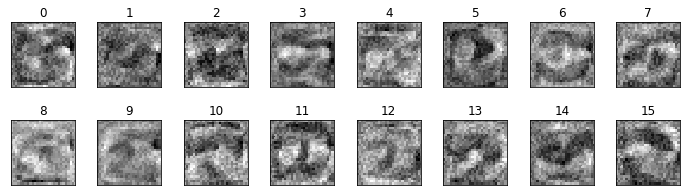

In [10]:
#-- 리스트 8-1-(10)
# 1층째의 무게 시각화
w = model.layers[0].get_weights()[0]
plt.figure(1, figsize=(12, 3))
plt.gray()
plt.subplots_adjust(wspace=0.35, hspace=0.5)
for i in range(16):
    plt.subplot(2, 8, i + 1)
    w1 = w[:, i]
    w1 = w1.reshape(28, 28)
    plt.pcolor(-w1)
    plt.xlim(0, 27)
    plt.ylim(27, 0)
    plt.xticks([], "")
    plt.yticks([], "")
    plt.title("%d" % i)
plt.show()

#### 결과 해석
- 27 x 27 의 입력으로부터 중간층의 16개 뉴런에 대한 가중치를 그리고 있다.
- 가중치 값이 양수이면 검은색으로, 음수인 경우에는 흰색으로 표시한다.
- 월내 가중치는 임의로 설정되어 있었으므로, 이 모습은 학습에 의해 확든한 것
- 검은 부분에 문자 일부분이 있으면 그 뉴런은 활성화하고, 흰 부분에 문자 일부분이 있으면 억제된다.
- 예를 들어 12번 뉴런의 가중치는 중심에 희미하게 2의 형태가 검게 나타나고 있다.
- 즉, 이 뉴런은 2의 이미지에서 활동이 증가하는 뉴런이다. 아마 2를 인식하는 데 도움될 것이다.
- 다른 뉴런도 특정 숫자의 특징에 반응하는 것 같다. 

--------
- 이렇게 간단한 피드 포워드 네트워크 모델에서도 약 93%의 정확도를 낼 수 있는 사실을 확인했다.
- 하지만 정밀도를 더욱 높이려면 중간층 뉴런을 늘리는 방법도 있겠지만 더 근본적인 문제는 사실 이 모델은 '입력이 2차원 이미지' 라는 공간 정보를 전혀 사용하지 않는다는 것이다.


- 28 x 28 의 입력 이미지를 길이 784의 벡터로 전개하여 네트워크에 입력한다. 
- 화소가 정렬 순서는 네트워크 성능과 전혀 관계가 없다.
- 예를 들어 전체 데이터셋에서 이미지 위치 (1,1)의 픽셀 값을 (3,5)의 픽셀 값으로 교환해도 동일한 정밀도로 학습할 수 있다. 이러한 변환을 계속해 각각의 이미지가 마구 섞여도 성능은 변하지 않는다. 
- 그 이유는 네트워크의 구조가 전결합형이며 모든 입력 성분은 대등한 관계이기 때문이다.
- 이웃에 있는 입력 성분도, 멀리 떨어진 입력 성분도 수치상으로는 똑같은 관계이므로 공간 정보가 사용되고 있지 않다. 

#### 공간 필터
- 공간 정보란 직선, 곡선, 원형이나 사각형 같은 모양을 나타내는 정보
- 이러한 형태를 골라내는 방법으로 '공간 필터'라는 이미지 처리법이 있다.
- 필터는 2차원 행렬로 표현한다. 2차원 행렬의 하나로, 세로 엣지를 강조하는 3x3 필터의 예를 아래 그림으로 나타냈다. 이미지의 일부분과 필터 요소를 곱한 합을, 이미지를 슬라이드 시키면서 이미지의 전 영역에서 구한다.
- 이러한 계산을 **'합성곱 연산'** 이라고 한다. 

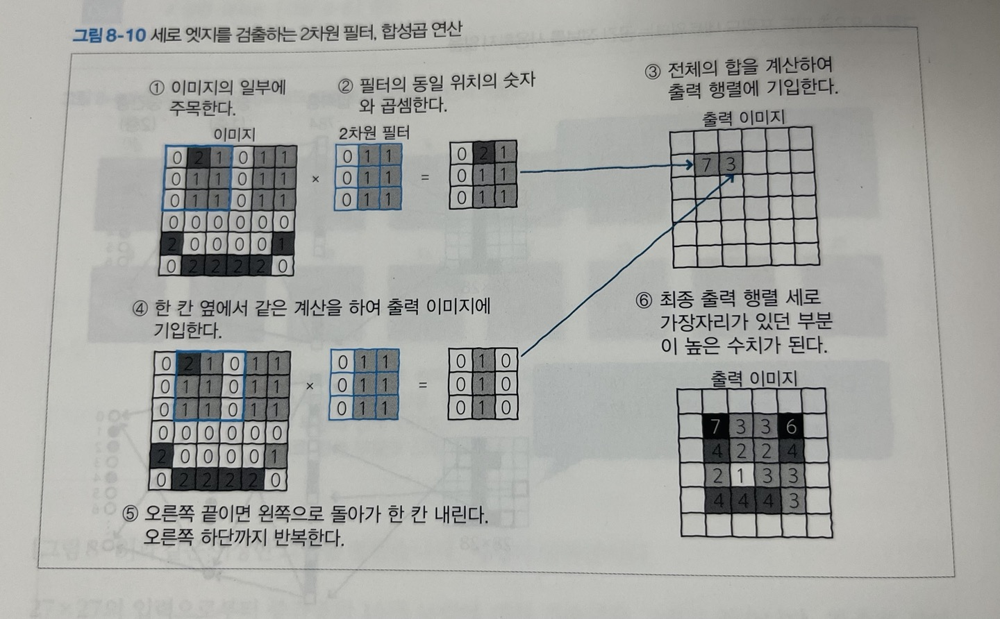


- 필터의 크기는 3x3 뿐만 아니라 임의로 결정할 수 있지만 중심을 결정할 수 있는 홀수 너비가 사용하기 쉬울 것이다.

- 실제 필기체 숫자에 합성곱 연산을 해보자. 이미지 데이터를 1차원에서 2차원으로 바꾸기 위해 일단 메모리를 초기화한다. 

In [11]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


- 다시 MNIST 데이터를 읽는데 이번에는 (data index) x 28 x 28인 채로 사용한다.
값은 0~1 사이의 float으로 한다. y_test 와 y_train은 이전처럼 1-of-k 부호화법으로 변환한다. 

In [12]:
#-- 리스트 8-2-(1)
import numpy as np
from keras.datasets import mnist
from keras.utils import np_utils
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(60000, 28, 28, 1)
x_test = x_test.reshape(10000, 28, 28, 1)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
num_classes = 10
y_train = np_utils.to_categorical(y_train, num_classes)
y_test = np_utils.to_categorical(y_test, num_classes)

- 그러면 가로 및 세로 엣지를 강조하는 2개의 필터를 훈련 데이터의 2번째인 4에 적용해보자. 필터는 코드의 (A)와 (B)에서 myfil1과 myfil2로 정의하고 있다. 

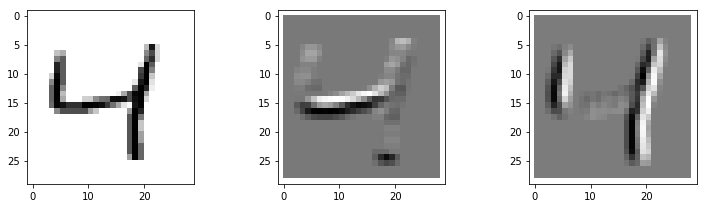

In [13]:
#-- 리스트 8-2-(2)
import matplotlib.pyplot as plt
%matplotlib inline


id_img = 2
myfil1 = np.array([[1, 1, 1],
                   [1, 1, 1],
                   [-2, -2, -2]], dtype=float) # (A)
myfil2 = np.array([[-2, 1, 1],
                   [-2, 1, 1],
                   [-2, 1, 1]], dtype=float) # (B)


x_img = x_train[id_img, :, :, 0]
img_h = 28
img_w = 28
x_img = x_img.reshape(img_h, img_w)
out_img1 = np.zeros_like(x_img)
out_img2 = np.zeros_like(x_img)

# 필터 처리
for ih in range(img_h - 3):
    for iw in range(img_w - 3):
        img_part = x_img[ih:ih + 3, iw:iw + 3]
        out_img1[ih + 1, iw + 1] = \
            np.dot(img_part.reshape(-1), myfil1.reshape(-1))
        out_img2[ih + 1, iw + 1] = \
            np.dot(img_part.reshape(-1), myfil2.reshape(-1)) 


# - 표시
plt.figure(1, figsize=(12, 3.2))
plt.subplots_adjust(wspace=0.5)
plt.gray()
plt.subplot(1, 3, 1)
plt.pcolor(1 - x_img)
plt.xlim(-1, 29)
plt.ylim(29, -1)
plt.subplot(1, 3, 2)
plt.pcolor(-out_img1)
plt.xlim(-1, 29)
plt.ylim(29, -1)
plt.subplot(1, 3, 3)
plt.pcolor(-out_img2)
plt.xlim(-1, 29)
plt.ylim(29, -1)
plt.show()

- 가로와 세로의 엣지를 강조하는 필터를 시험했지만, 필터의 수치를 바꾸는 것으로 대각선 엣지 강조, 이미지 스무딩, 세부 부분의 강조 등 다양한 처리가 가능하다. 
- 그런데 모든 필터 요소를 합하면 0이 되도록 디자인되어 있다.
- 이렇게 하면 공간 구조가 없는 균일한 부분은 0으로 변환되고, 필터에서 추출하려는 구조가 존재할 경우에는 0이상의 값으로 변환되어, 0을 감지 레벨의 기준으로 세울 수 있어 편리하다.
- 필터를 적용하면 출력 이미지의 크기는 작아진다. 때문에 불편함도 생기는데, 에를 들어 연속을오 다양한 필터를 적용하면 이미지가 점점 작아져버린다.
- 이 대응책으로 패딩이라는 방법이 있다. 

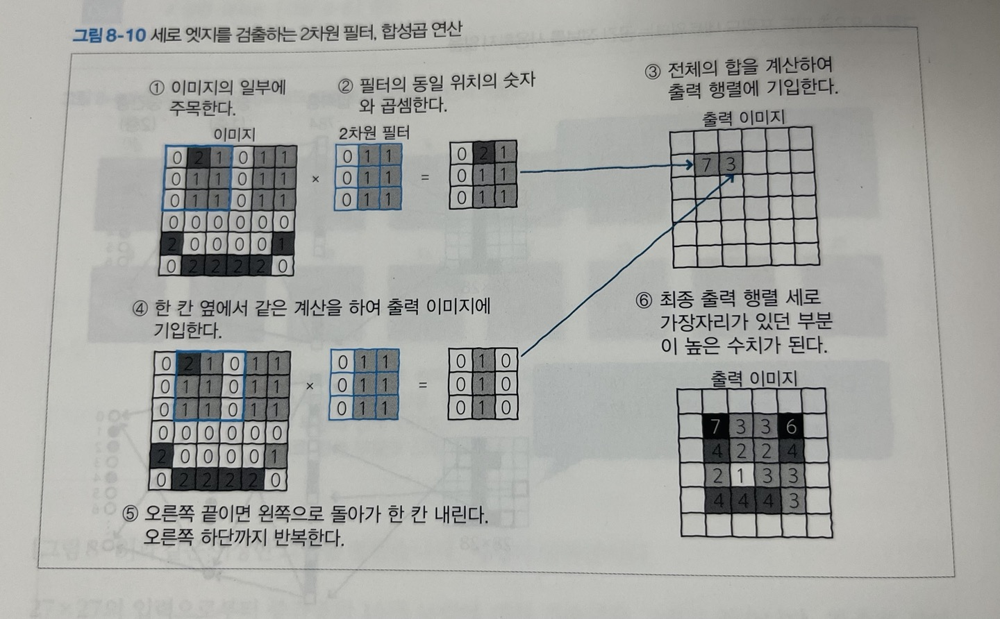


- 패딩은 필터를 적용하기 전에 0 등의 고정된 요소로 주위를 부풀려두는 방법
- 3x3 필터를 적용할 경우에는 폭 1의 패딩을 하면 이미지 크기는 변하지 않는다.
- 5x5의 경우에는 폭이 2인 패딩을 하면 좋을 것이다.
- 패딩 뿐 아니라 필터 처리와 관련된 매개변수로 stride가 있다. 
- 지금까지의 필터는 한 칸씩 이동했지만 stride를 조절해서 2칸 이나 3칸 등 어떤 간격으로든 이동할 수 있다.
- 스트라이드를 크게 하면 출력이미지가 작아진다.
- 패딩과 스트라이드 값은 라이브러리로 합성곱 네트워크를 사용할 때 인수로 전달하게 된다. 

### 8.5 힙성곱 신경망

- 합성곱 신경망: 필터를 사용한 신경망

- 필터에 적용하는 수치에 따라 다양한 이미지 처리가 가능하지만 CNN은 그 필터 자체를 학습시킨다.
- 먼저 필터 8장을 사용한 간단한 CNN을 만들어보자.
- 입력 이미지에 대해 크기 3x3, padding 1, stride 1의 필터를 8장 적용한다.
- 1장의 필터의 출력은 28x28 배열이므로 총 28 x 28x 8의 3차원 배열이 된다.
- 이를 1차원으로 길이가 6272인 배열로 전개하고, 전결합으로 10개의 출력층 뉴련에 결합한다. 

In [14]:
#-- 리스트 8-2-(3)
import numpy as np
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.optimizers import Adam
import time


model = Sequential()
model.add(Conv2D(8, (3, 3), padding='same',
                 input_shape=(28, 28, 1), activation='relu')) # (A)
model.add(Flatten()) # (B)
model.add(Dense(10, activation='softmax'))
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(),
              metrics=['accuracy'])
startTime = time.time()
history = model.fit(x_train, y_train, batch_size=1000, epochs=20,
                    verbose=1, validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))

Train on 60000 samples, validate on 10000 samples
Epoch 1/20
60000/60000 [==============================] - 7s 120us/step - loss: 0.7696 - acc: 0.8154 - val_loss: 0.3387 - val_acc: 0.9044
Epoch 2/20
60000/60000 [==============================] - 7s 116us/step - loss: 0.3161 - acc: 0.9093 - val_loss: 0.2741 - val_acc: 0.9215
Epoch 3/20
60000/60000 [==============================] - 7s 123us/step - loss: 0.2648 - acc: 0.9255 - val_loss: 0.2409 - val_acc: 0.9341
Epoch 4/20
60000/60000 [==============================] - 8s 128us/step - loss: 0.2300 - acc: 0.9354 - val_loss: 0.2120 - val_acc: 0.9424
Epoch 5/20
60000/60000 [==============================] - 8s 128us/step - loss: 0.2019 - acc: 0.9440 - val_loss: 0.1899 - val_acc: 0.9487
Epoch 6/20
60000/60000 [==============================] - 7s 115us/step - loss: 0.1807 - acc: 0.9501 - val_loss: 0.1710 - val_acc: 0.9541
Epoch 7/20
60000/60000 [==============================] - 7s 114us/step - loss: 0.1620 - acc: 0.9556 - val_loss: 0.1579 - 

- (A) 에서 합성곱층 Conv2D()을 model에 추가한다.
- 첫 번째 인수 (8, 3x3)은 3x3 필터를 8개 사용한다는 뜻이다.
- padding = 'Same' 은 출력 크기가 변하지 않도록 패딩을 추가해 처리한다는 의미이다.
- input_shape = (28 , 28 ,1)은 입력 이미지의 크기이다.
- 지금은 흑백 이미지를 다루고 있기 때문에 마지막 인수를 1로 하고 있다.(컬러의 경우 3)
- activation = 'relu' 는 필터를 입힌 후의 이미지에 ReLU 활성화함수를 적용함을 나타낸다.
- 바이어스 입력도 지정되어 있는데, 바이어스는 각 필터에 1변수씩 할당된다.
- 또 필터의 학습전의 입력도 지정되어 있다.
- 바이어스는 각 필터에 1변수씩 할당된다. 또한 필터의 학습전 초기값은 임의로 설정되며 바이어스의 초기값은 0으로 설정된다.

---------
- 합성곱층의 출력은 4차원으로 그 크기는 (배치 수, 필터 수, 출력 이미지의 세로폭, 출력 이미지의 가로폭)으로 되어 있다.
- 이것을 다음 출력층 (Dens 층)에 넣으려면 (배치수 , 필터 수 x 출력 이미지 세로 폭 x 출력 이미지 가로 폭)의 2차웡느로 해야 한다.
- 이러한 변환은 (B)의 model.add(Flatten())에서 실시하고 있다.


In [15]:
#-- 리스트 8-1-(7)
def show_prediction():
    n_show = 96
    y = model.predict(x_test) # (A)
    plt.figure(2, figsize=(12, 8))
    plt.gray()
    for i in range(n_show):
        plt.subplot(8, 12, i + 1)
        x = x_test[i, :]
        x = x.reshape(28, 28)
        plt.pcolor(1 - x)
        wk = y[i, :]
        prediction = np.argmax(wk)
        plt.text(22, 25.5, "%d" % prediction, fontsize=12)
        if prediction != np.argmax(y_test[i, :]):
            plt.plot([0, 27], [1, 1], color='cornflowerblue', linewidth=5)
        plt.xlim(0, 27)
        plt.ylim(27, 0)
        plt.xticks([], "")
        plt.yticks([], "")

#### 결과 해석
- 정답률이 약 97%이다. 지난번 2층 ReLU 네트워크에서는 약 92%였으므로 상당히 개선되었다.
- show_prediction()은 reset을 했기 때문에 다시 정의해야 한다. 

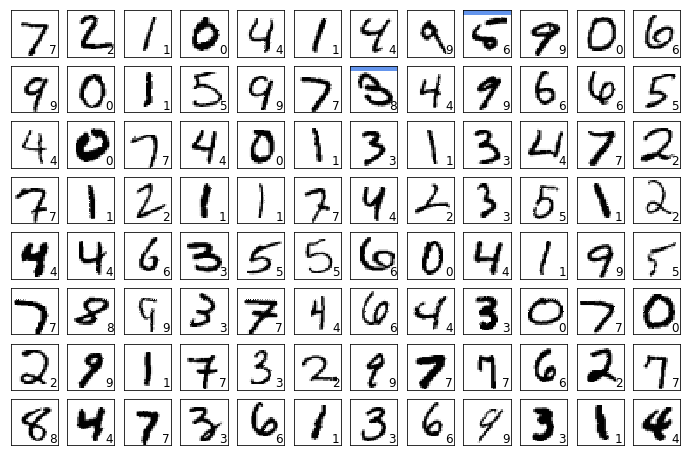

In [16]:
# 리스트 8-2-(4)
show_prediction()
plt.show()

- 테스트 결과 96개중 잘못 인식한 것은 단 2개이다. 
- 학습에서 획득한 8장의 필터를 살펴보자.

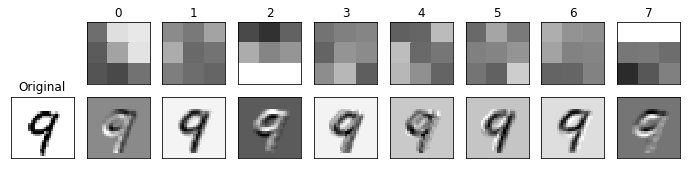

In [17]:
# 리스트 8-2-(5)
plt.figure(1, figsize=(12, 2.5))
plt.gray()
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.subplot(2, 9, 10)
id_img = 12
x_img = x_test[id_img, :, :, 0]
img_h = 28
img_w = 28
x_img = x_img.reshape(img_h, img_w)
plt.pcolor(-x_img)
plt.xlim(0, img_h)
plt.ylim(img_w, 0)
plt.xticks([], "")
plt.yticks([], "")
plt.title("Original")


w = model.layers[0].get_weights()[0] # (A)
max_w = np.max(w)
min_w = np.min(w)
for i in range(8):
    plt.subplot(2, 9, i + 2)
    w1 = w[:, :, 0, i]
    w1 = w1.reshape(3, 3)
    plt.pcolor(-w1, vmin=min_w, vmax=max_w)
    plt.xlim(0, 3)
    plt.ylim(3, 0)
    plt.xticks([], "")
    plt.yticks([], "")
    plt.title("%d" % i)
    plt.subplot(2, 9, i + 11)
    out_img = np.zeros_like(x_img)
    # 필터 처리
    for ih in range(img_h - 3):
        for iw in range(img_w - 3):
            img_part = x_img[ih:ih + 3, iw:iw + 3]
            out_img[ih + 1, iw + 1] = \
            np.dot(img_part.reshape(-1), w1.reshape(-1))
    plt.pcolor(-out_img)
    plt.xlim(0, img_w)
    plt.ylim(img_h, 0)
    plt.xticks([], "")
    plt.yticks([], "")
plt.show()

- 테스트 데이터 x_test에서 12번쨰의 9의 이미지를 적용한 예도 표시한다.
- 결과를 살펴보면 2번 필터는 가로줄의 아래쪽 엣지를 강조하고, 7번 필터는 가로줄의 위쪽 엣지를 가조하는 기능이 있다.
- 이러한 필터들은 자동으로 학습된 것이다.
- 이렇게 합성곱 네트워크는 필기체 숫자 뿐만 아니라 문자 인식이나 화상 인식 등에서도 힘을 발휘한다. 

### 8.6 풀링

- 합성곱은 2차원 이미지가 가지는 특징을 이요할 수 있었지만 이미지 위치의 어긋남에 대한 견고성도 따져보아야 한다. 
- 예를 들어 필기체 숫자 2가 1픽셀만 어긋난 이미지를 입력해도 각 배열의 수치는 완전히 달라진다.
- 인간의 눈으로 봐서는 거의 동일한 입력이지만 네트워크에서는 완전히 다른 패턴으로 인식되어 버린다.
- 이것은 cnn을 사용해도 마찬가지인데, 이 문제를 해결하는 방법으로 '풀링 처리'가 있다.
- 출력 이미지는 입력 이미지가 가로 세로로 어긋나도 거의 변하지 않는 성질을 가질 수 있다.
- 이 풀링층을 네트워크에 도입하여 위치만 어긋난 이미지에 비슷한 출력을 반환하는 성질을 덧붙일 수 있다.
- 최대 풀링 외에 평균 풀링이 있다. 이 경우. 작은 영역의 수치의 평균을 출력값으로 한다.
- 작은 영역은 2x2 뿐만 아니라 3x3, 4x4 이렇게 임의의 크기를 결정할 수 있다.
- 그에 대한 스트라이드도 임의로 결정할 수 있지만 3x3에 대해서는 스트라이드 3, 4x4에 대해서는 스트라이드 4와 같이 작은 공간의 크기와 같은크기로 하는 경우가 많다. 

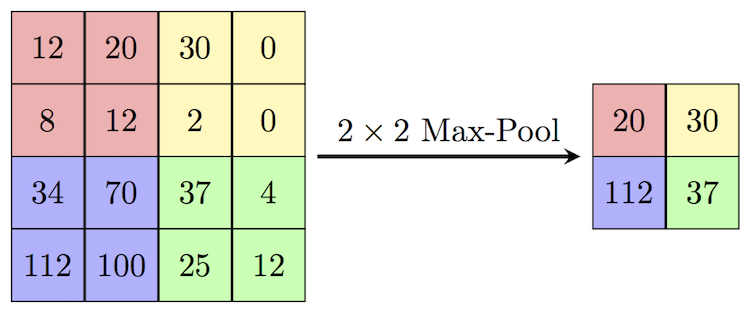

### 8.7 Dropout
- 네트워크의 학습을 개선하는 방법으로 드롭아웃 이라는 방법이 니티시 스리바스타바 제프리 힌튼 등의 논문에서 제안되었다.
- 이 방법은 다양한 응용 분야에서 좋은 결과를 얻고 있다. 

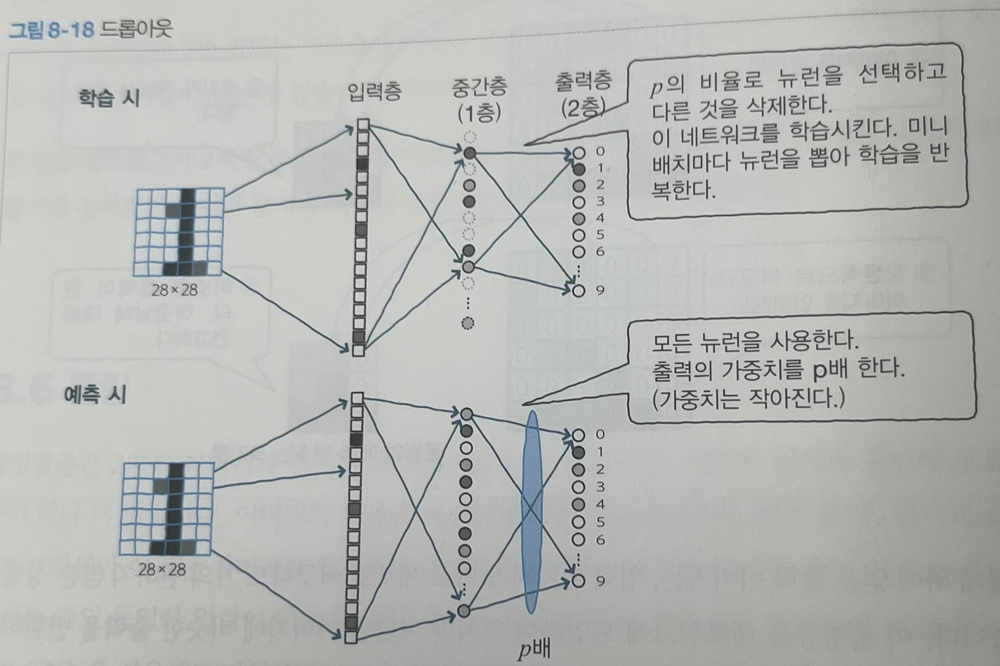

드롭아웃은 학습 시에 입력층의 유닛과 중간층 뉴런을 확률 p(p<1)로 음의로 선택하여 나머지를 무효화하는 방법이다.
무효화된 뉴런은 존재하지 않는 것으로 하여 학습을 갱신한다.
미니 배치마다 뉴런을 뽑아 다시 이 절차를 반복한다.

학습 후 예측하는 경우에는 모든 뉴런이 사용된다. 학습 시에는 p의 비율이 뉴런밖에 존재하지 않는 상태에서 학습하고 있었는데, 에측 시에 전체 참가가 되면 출력이 커져 버린다. (1/P배) 그래서 예측 시에는 드롭아웃을 한 층의 출력 대상의 가중치를 p배로 하여 작게 설정하여 계산을 맞춘다.
드롭아웃은 여러 네트워크를 각각 학습시켜 예측 시에 네트워크를 평균화해 합치는 효과가 있다. 

### 8.8 MNIST 인식 네트워크 모델

- 합성곱 네트워크에 풀링과 드롭아웃을 도입하여 계층의 수를 늘리고, 모두를 갖추고 있는 네트워크를 마지막으로 구축해보자. 
- 먼저 1층 2층에서 합성곱층을 연속시킨다. 1층 째의 합성곱층은 16장의 필터를 사용하고 있기 때문에, 출력은 28x28 의 이미지가 16장이 된다. 이것을 28 x 28 x 16의 3차원 배열의 데이터로 간주한다. 

다음 층의 합성곱은 이 3차원 배열의 데이터에 대해 수행된다. 3x3의 1장의 필터는 실질적으로 3x3x16의 배열로 정의된다. 출력은 28x28x16의 블록이다. 16의 깊이분에 별도의 필터가 할당되어 독립적으로 처리되는 인상을 갖는다. 이 3x3x16의 크기를 가지는 필터가 32개 있는 두 번째 레이어의 합성곱층이다. 필터를 정의하는 매개 변수의 수는 바이어스 항을 제외하면 3x3x16x32 이 된다. 

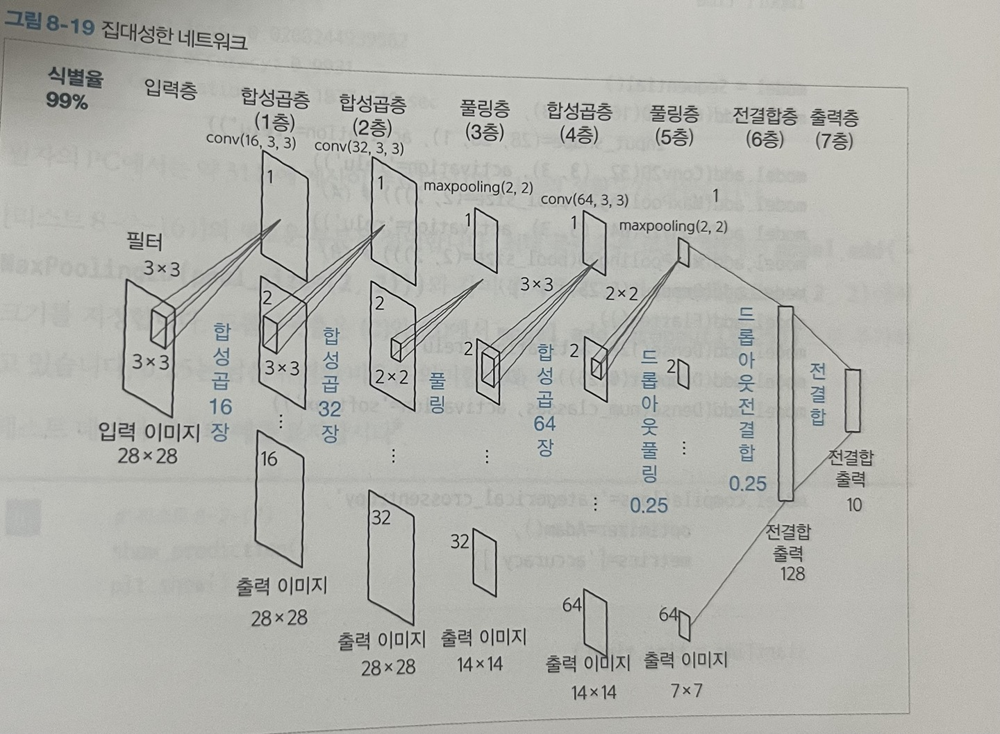


3층째는 2x2 맥스 풀링층으로 이미지의 가로 세로의 크기는 절반인 14x14가 되고, 4층째 에서 한번 더 합성곱층이 온다. 여기서 필터의 수는 64장이다. 매개 변수의 수는 3x3x32x64 이다. 5층째에서 다시금 맥스 풀링에 의한 이미지 크기가 7x7로 되어, 다음 6층째는 128개의 전결합, 마지막 7층째는 출력이 10개인 전결합층이 된다. 5층과 6층에서는 드롭아웃도 넣고 있다. 

In [18]:
# 리스트 8-2-(6)
import numpy as np
np.random.seed(1)
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import Adam
import time


model = Sequential()
model.add(Conv2D(16, (3, 3),
                 input_shape=(28, 28, 1), activation='relu'))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) # (A)
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) # (B)
model.add(Dropout(0.25)) # (C)
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.25)) # (D)
model.add(Dense(num_classes, activation='softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=Adam(),
              metrics=['accuracy'])


startTime = time.time()


history = model.fit(x_train, y_train, batch_size=1000, epochs=20,
                    verbose=1, validation_data=(x_test, y_test))


score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])
print("Computation time:{0:.3f} sec".format(time.time() - startTime))


Train on 60000 samples, validate on 10000 samples
Epoch 1/20
60000/60000 [==============================] - 57s 958us/step - loss: 0.6237 - acc: 0.8080 - val_loss: 0.1167 - val_acc: 0.9645
Epoch 2/20
60000/60000 [==============================] - 56s 931us/step - loss: 0.1296 - acc: 0.9614 - val_loss: 0.0622 - val_acc: 0.9799
Epoch 3/20
60000/60000 [==============================] - 56s 930us/step - loss: 0.0860 - acc: 0.9740 - val_loss: 0.0465 - val_acc: 0.9860
Epoch 4/20
60000/60000 [==============================] - 56s 926us/step - loss: 0.0676 - acc: 0.9790 - val_loss: 0.0377 - val_acc: 0.9884
Epoch 5/20
60000/60000 [==============================] - 56s 926us/step - loss: 0.0557 - acc: 0.9829 - val_loss: 0.0319 - val_acc: 0.9890
Epoch 6/20
60000/60000 [==============================] - 56s 928us/step - loss: 0.0499 - acc: 0.9843 - val_loss: 0.0290 - val_acc: 0.9907
Epoch 7/20
60000/60000 [==============================] - 56s 929us/step - loss: 0.0452 - acc: 0.9856 - val_loss: 0.

#### 결과 해석
- 약 99%의 정확도가 나왔다.
- 최대 풀링층은 (A)와 (B)에서 model.add(MaxPooling2D(pool_size = (2,2)) 와 같이 추가한다.
- 인수 pool_size = (2,2) 에서 크기를 지정한다.
- 드롭아웃층은 (C)와 (D)에서 model.add(Dropout(0.25))으로 추가하고 있다. 0.25는 남는 뉴런의 비율을 의미한다. 
--------------
집대성한 네트워크에서 테스트 데이터를 출력해보자.

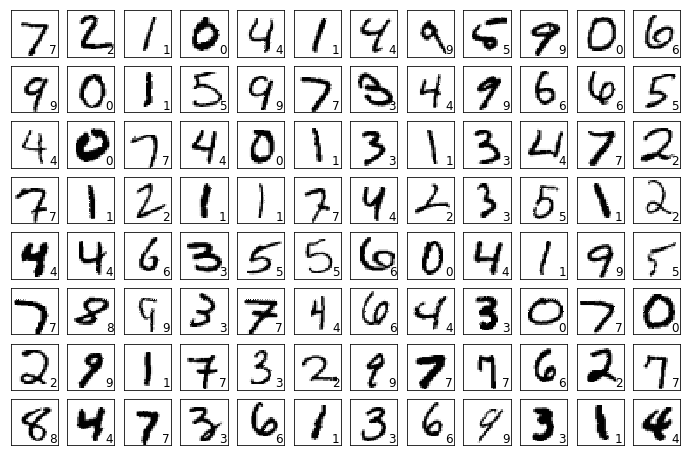

In [19]:
# 리스트 8-2-(7)
show_prediction()
plt.show()

#### 결과 해석
- 테스트 데이터의 처음 96개는 잘못된 인식 없이 모두 정답이 되었다.
- 게속 정답이 되지 않았던 오른쪽 위에서 4번째의 찌그러진 5도 드디어 정답이 되었다. 즉 만족할 만한 정확도를 얻었다.
- 여기에서 모든 기술을 시험한다는 점에 중점을 두어 네트워크를 디자인 했기 때문에, 앞으로 더 단순하고 정확한 네트워크를 만드는 것도 가능할 것이다.
- 실제로 집필 중인 시점에서 일반화된 드롭아웃을 사용한 매우 단순한 모델이 99%라는 최고 정답률을 내고 있다.
- MNIST데이터보다 더 큰 크기의 자연어 이미지를 처리하거나 많은 카테고리를 다루는 경우에는 층의 심층화, 합서곱, 풀링, 드롭아웃 효과가 더 강력하게 발휘될 것이다. 

# AFTER

### SGD (확률적 경사하강법) & MB-GD (Mini-Batch)

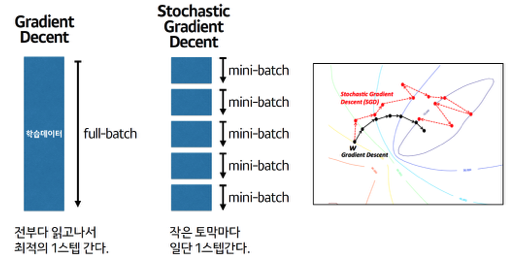

    - 전체 데이터가 아닌 특정 데이터로 학습하는 SGD는 DNN에서 주로 이용되는 최적화 기법

    - GD의 느린 속도를 개선하기 위해 사용

    - i번째 뉴런의 j번째 weight

1) SGD

    추출된 데이터 한 개에 대해서 error gradient 를 계산하고, Gradient descent 알고리즘을 적용하는 방법.

    모델의 레이어 층은 하나의 행렬곱으로 생각할 수 있고, 여러개의 묶음 데이터는 행렬이라고 생각 할 수 있다.

    즉, 여러개의 묶음 데이터를 특정 레이어 층에 입력하는 것은 행렬 x 행렬로 이해할 수 있는데,

    SGD는 입력 데이터 한 개만을 사용하기 때문에 한 개의 데이터를 '벡터' 로 표현하여 특정 레이어 층에 입력하는 것으로 이해할 수 있고 이는 벡터 x 행렬 연산이 된다.


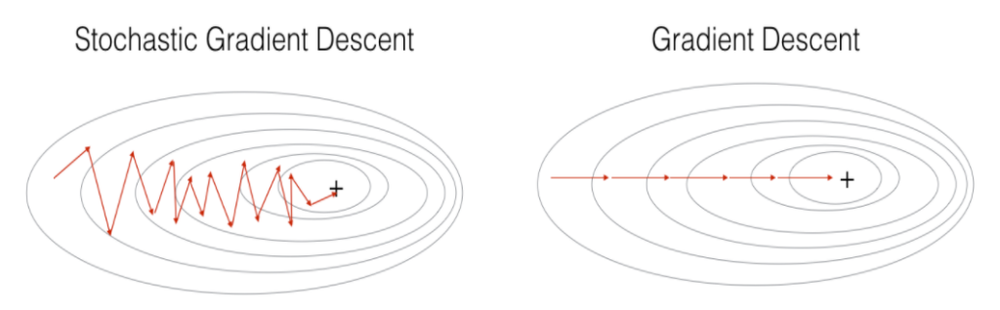

● SGD의 장점
- 위 그림에서 보이듯이 Shooting 이 일어나기 때문에 local optimal 에 빠질 리스크가 적다.

- tep 에 걸리는 시간이 짧기 때문에 수렴속도가 상대적으로 빠르다.

● SGD의 단점

- global optimal 을 찾지 못 할 가능성이 있다.

- 데이터를 한개씩 처리하기 때문에 GPU의 성능을 전부 활용할 수 없다.



2) BGD

    - mini batch 단위로 정의되는 loss function을 적용한다.

    - batch_size 단위로 학습하는 것을 제외하고 SGD와 같다.

    - batch 단위로 연산을 하기 때문에 행렬 연산이 가능
    
 ● BGD의 장점
 
 - 전체 데이터에 대해 업데이트가 한번에 이루어지기 때문에 후술할 SGD 보다 업데이트 횟수가 적다. 따라서 전체적인 계산 횟수는 적다.

- 전체 데이터에 대해 error gradient 를 계산하기 때문에 optimal 로의 수렴이 안정적으로 진행된다.

- 병렬 처리에 유리하다.


● BGD의 단점

- 한 스텝에 모든 학습 데이터 셋을 사용하므로 학습이 오래 걸린다.

- 전체 학습 데이터에 대한 error 를 모델의 업데이트가 이루어지기 전까지 축적해야 하므로 더 많은 메모리가 필요하다.

- local optimal 상태가 되면 빠져나오기 힘듦
 

3) SGD의 변형

    - 최적화를 더욱 효율적으로 하기 위해 여러 변형된 기법들이 탄생했다.

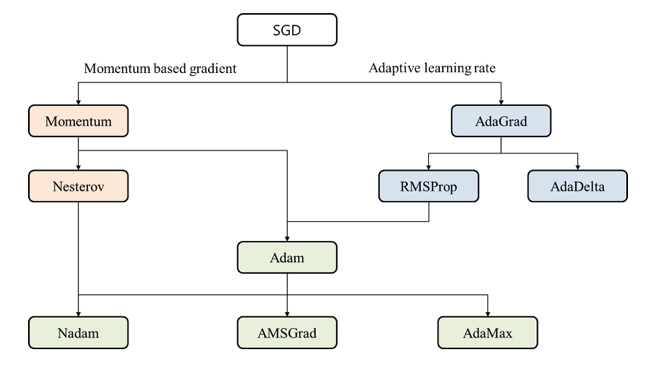

### pooling
- 풀링은 입력이 작게 이동해도 근사적으로 invariant(불변)이 되게 하는데 도움을 준다. 
풀링 여난 자체가 풀링 커널 내부의 각 인접 픽셀들 몇개만을 대상으로 진행되기 때문에, 입력이 조금 이동하더라도 풀링된 출력들은 거의 변하지 않는다. 때문에, 어떤 특징의 구체적인 위치가 아닌 그런 특징의 존재 여부 자체가 더 중요할때는 이러한 국소 이동에 대한 불변성이 유용하다.
- 위치 보존이 필요치 않은 작업 (ex, object detection)에는 유용하다.
- 풀링을 하는 중요한 이유는 바로 **입력 데이터의 차원 감소** 이다. 
- 국소 부위에서 대표되는 픽셀로 대체하면, 데이터의 차원이 감소하게 된다. 예를 들어 VGGNet 에서 처럼 2x2 크기로 스트라이드를 2로 설정하면, 입력 피쳐맵의 크기는 반으로 줄어든다. 때문에 신경망의 계산효율성이 좋아진다. 이는 메모리 요구량의 감소로 이어진다. 만약 여러 개의 크기가 다른 이미지를 입력받는다고 할 때에도 풀링은 유용하다. 입력 이미지에 알맞게 커널 크기와 스트라이드를 조절하여 항상 같은 크기의 피쳐맵을 생성하게 할 수 있다. 

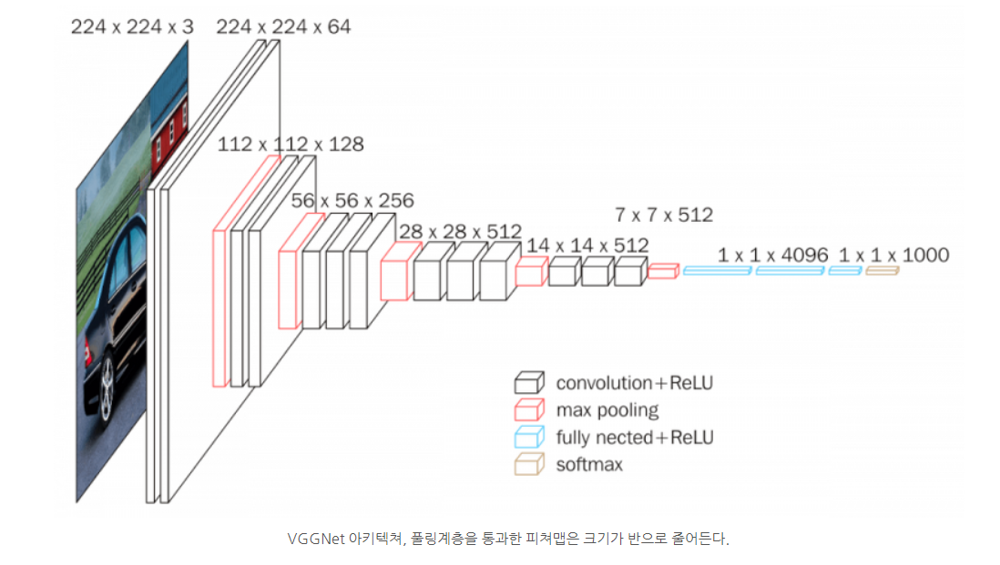

## 최근 pooling 경향성

 VGG까지는 Max pooling을 많이 사용했으나, 요즘 경향은 Max pooling으로 차원을 감소하지 않고, 컨볼루션 필터의 스트라이드를 늘리는 것으로 차원축소를 한다. ResNet이나 GoogleNet에서 좀더 깊은 망을 실현시키기 위해 처음 도입했다. **이유는, Max Pooling으로 일정 영역의 강한 feature만을 다음 레이어로 넘기면, 처음에는 싼 계산량으로 좋은 성능을 유지할 수 있을지 몰라도 매우 Deep 한 신경망으로 가면 갈수록 점점 더 미세한 feature가 중요해지는데, 해당 정보가 날아가기 때문** 에 컨볼루션 연산을 수행해서 스트라이드를 늘리는 방식으로 차원을 축소한다. 
 이를 통해서 feature를 버리는게 아니라 feature에 대해 컨볼루션 연산을 수행해서 해당 feature을 고려할 수 있기 때문에 deep한 망으로 가면 갈수록 이점이 존재하는 것이다. 
 
 맥스 풀링을 사용한 이유는 강한 특징은 더 큰 활성화 갓을 가질 것이라는 가정으로 avg pooling 이나 랜덤 풀링보다 더 낮다는 믿음으로 사용한 것이었고 이것이 큰 효과를 발휘하기도 해서 널리 사용된 것이다. 그런데 이를 지금와서 다시 보면 max pooling도 강한 inductive bias를 가지고 있다. 최근 연구들이 transformer나 mlp mixer등 이러한 inductive bias를 최소화하는 쪽으로 점점 트랜드가 옮겨지고 있는 것을 보면 이후 max pooling 대신 convolution stride로 spatial dimension redution을 수행하게 된 것을 알 수 있다. 

### dropout과 ensemble 연관성
Dropout은 간단하지만 아주 강력한 정규화(regularization) 방법입니다. 최근 나온 기법들에 밀리지 않고 여전히 유용하고 좋은 성능을 보여준다. 


훈련을 통해 학습되는 머신러닝 및 딥러닝의 특성상, 무작위로 초기화되고 무작위로 데이터에 접근한다는 방식 때문에 같은 데이터로 훈련한 모델이더라도 다른 결과를 낼 수 있다. 하지만, 같은 데이터로 여러 개의 서로 다른 모델을 훈련한 뒤 그 결과를 다수결 등으로 종합해 보면 통계적으로 덜 '튀는' 결과가 나와 더 높은 정답률을 얻게 된다. 이 방식을 앙상블(ensemble) 모델이라고 한다. 앙상블은 가장 대표적인 정규화 방법이기도 하다. Dropout은, 비록 모델은 여러 개를 만들지 못하지만 훈련 과정에서 앙상블의 효과를 내게 된다. 같은 변수들을 공유하는 하나의 모델만을 사용한다는 점이 일반적인 앙상블 모델과 다른 점이다
하나의 인공신경망에서 앙상블을 실현시키기 위해서, 훈련 단계에서 dropout 은 강제로 특정 퍼셉트론을 없애버립니다. 그 과정에서 그 퍼셉트론에 연결된 가중치들도 의미없는 값이 됩니다. 구현할 때는 일단 계산한 후 0 or 1 마스크를 곱해 결과값을 0으로 만들어버리는 방식으로 구현합니다. 매번 미니 배치가 들어올 때마다 무작위로 다른 퍼셉트론들을 끊어냅니다. 이 과정에서 약간씩 다른, 엄청 다양한 구조가 학습된다고 생각할 수 있습니다. 한번 끊은 퍼셉트론이 다시 연결이 안 되는 경우에는 퍼셉트론이 가지치기(pruning)되었다고 이야기합니다.


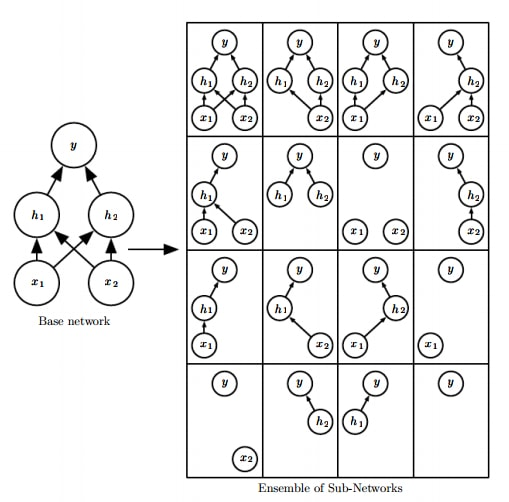